In [1]:
# !pip install cufflinks
# !pip install plotly
# !pip install seaborn
# !pip install pandas_datareader
# !pip install yfinance

In [2]:
# Import key librares and modules 
import pandas as pd
import numpy as np

# datetime offers classes that work with date & time information
import datetime as dt

# Matplotlib is a comprehensive data visualization library in Python 
# Seaborn is a visualization library that sits on top of matplotlib and offers enhanced features 
# plotly.express module contains functions that can create interactive figures using a few lines of code
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio

# Let's plot a candlestick graph using Cufflinks library
# Cufflinks is a powerful Python library that connects Pandas and Plotly for generating plots using few lines of code
# Cufflinks allows for interactive data visualization
#import cufflinks as cf
#cf.go_offline() # Enabling offline mode for interactive data visualization locally

# Plot volatility vs. return for all simulation runs
import plotly.graph_objects as go

In [3]:
# # Code to obtain stock data using Pandas Datareader
# tickers = ['AMZN', 'JPM', 'META', 'PG', 'GOOGL', 'CAT', 'PFE', 'EXC', 'DE', 'JNJ'] 

# # Library provides functions to extract financial data from various online sources, including Yahoo Finance.
# from pandas_datareader import data as pdr
# import yfinance as yfin
# yfin.pdr_override()

# # Indicate the start and end dates
# start = dt.datetime(2018, 1, 1)
# end = dt.datetime.now()

# # Data is saved in a stock_data.csv file
# df = pdr.get_data_yahoo(tickers, start = start, end = end)
# print(df)
# df.to_csv('stock_data.csv')


In [4]:
# Note that yfinance and Pandas Datareader might experience outage in some geographical regions
  
# AMZN: Amazon Inc. - Multinational tech company focusing on e-commerce, cloud computing, and artificial intelligence
# JPM: JPMorgan Chase and Co. - Multinational investment bank and financial services holding company
# META: Meta Platforms, formerly named Facebook Inc. - META owns Facebook, Instagram, and WhatsApp
# PG: Procter and Gamble (P&G) - Multinational consumer goods corporation
# GOOG: Google (Alphabet Inc.) - Multinational company that focuses on search engine tech, e-commerce, Cloud and AI 
# CAT: Caterpillar - World's largest construction-equipment manufacturer
# PFE: Pfizer Inc. - Multinational pharmaceutical and biotechnology corporation
# EXC: Exelon - An American Fortune 100 energy company 
# DE: Deere & Company (John Deere) - Manufactures agricultural machinery and heavy equipment
# JNJ: Johnson & Johnson - A multinational corporation that develops medical devices and pharmaceuticals

close_price_df = pd.read_csv('Stock_prices.csv')
close_price_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [5]:
# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df = close_price_df.iloc[:, 1:].pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df


,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...
2252,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [6]:
# # Insert the date column at the start of the Pandas DataFrame (@ index = 0)
daily_returns_df.insert(0, "Date", close_price_df['Date'])
daily_returns_df



,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1/3/2014,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,1/6/2014,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1/7/2014,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,1/8/2014,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,12/13/2022,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,12/14/2022,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,12/15/2022,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [7]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_financial_data(df, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        fig.update_traces(line_width = 3)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

In [8]:
# Plot closing prices using plotly Express. Note that I used the same pre-defined function "plot_financial_data"
plot_financial_data(close_price_df, 'Adjusted Closing Prices [$]')


In [9]:
# Plot the stocks daily returns
plot_financial_data(daily_returns_df, 'Percentage Daily Returns [%]')

In [10]:
# Plot histograms for stocks daily returns using plotly express
fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor': "white"})

<Axes: >

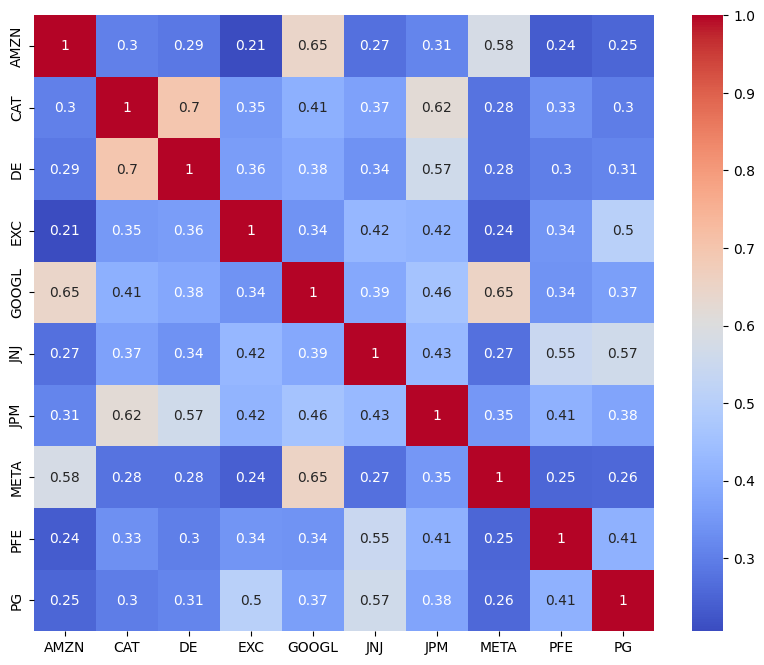

In [11]:
# Plot a heatmap showing the correlations between daily returns
# Strong positive correlations between Catterpillar and John Deere - both into heavy equipment and machinery
# META and Google - both into Tech and Cloud Computing
plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(), annot = True, cmap='coolwarm')

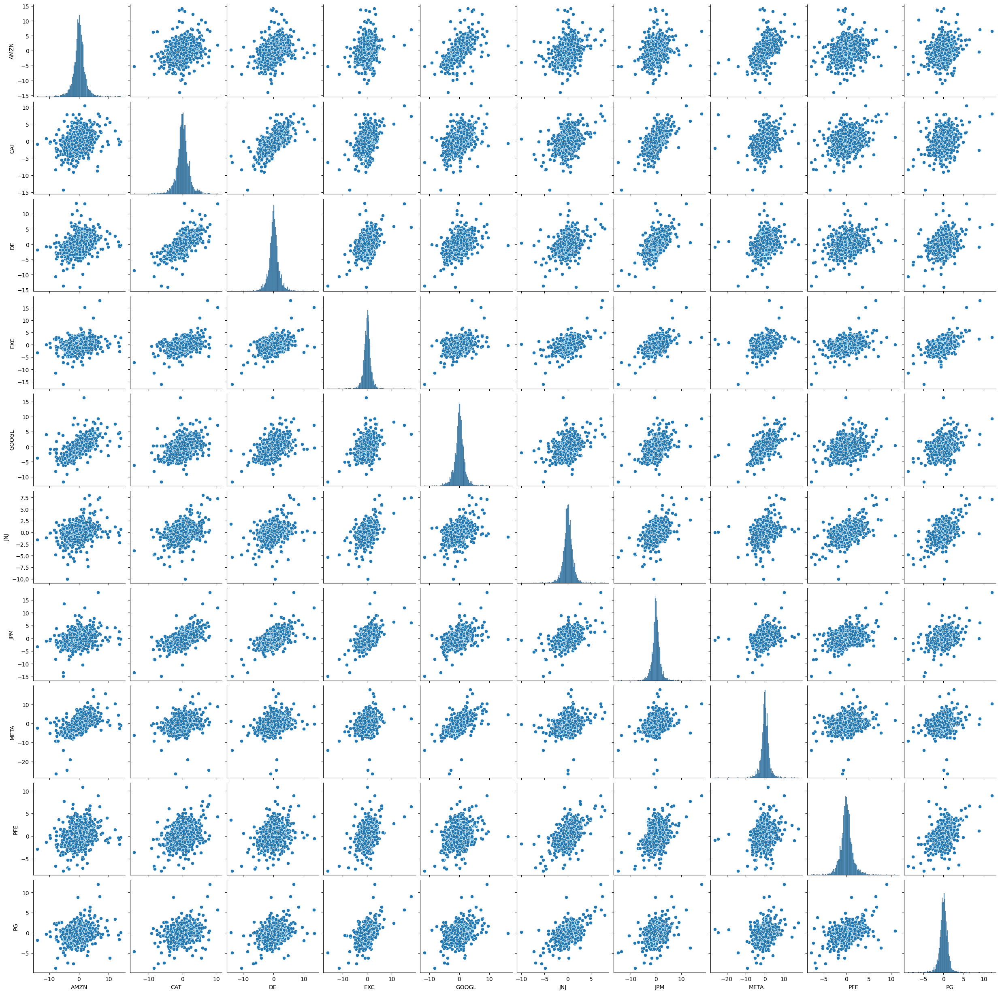

In [12]:
# Plot the Pairplot between stocks daily returns
sns.pairplot(daily_returns_df)

In [13]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [14]:
price_scaling(close_price_df)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [15]:
# Plot closing prices using plotly Express. Note that I used the same pre-defined function "plot_financial_data"
plot_financial_data(price_scaling(close_price_df), 'Scaled Adjusted Closing Prices [$]')

In [16]:
# Let's create an array that holds random portfolio weights
# Note that portfolio weights must add up to 1 
import random

def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
        
    # let's make the sum of all weights add up to 1
    weights = weights/np.sum(weights)
    return weights

In [17]:
# Call 10 random number
weights = generate_portfolio_weights(10)
print(weights)

[0.04758418 0.01628337 0.21730448 0.06472412 0.19776526 0.08297854
 0.04975613 0.1852812  0.06175121 0.07657151]


In [18]:
# Scale stock prices using the "price_scaling" function that I defined earlier (make all stock values start at 1)
portfolio_df = close_price_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [19]:
# Use enumerate() method to obtain the stock names along with a counter "i" (0, 1, 2, 3,..etc.)
# This counter "i" will be used as an index to access elements in the "weights" list
initial_investment = 1000000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i] * scaled_df[stock]  * initial_investment
portfolio_df.round(1)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,47584.2,16283.4,217304.5,64724.1,197765.3,82978.5,49756.1,185281.2,61751.2,76571.5
1,1/3/2014,47401.2,16274.3,218267.5,63413.9,196322.6,83726.0,50140.8,184773.2,61872.9,76485.9
2,1/6/2014,47065.3,16060.5,216461.8,63818.9,198511.5,84163.6,50431.4,193713.9,61933.7,76666.6
3,1/7/2014,47591.4,16113.0,217424.8,64152.4,202338.4,85950.2,49850.2,196152.2,62318.9,77408.1
4,1/8/2014,48056.5,16151.1,215089.5,64009.4,202759.5,85831.7,50320.3,197202.1,62744.6,76286.3
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,216536.3,54594.5,1255907.9,194800.3,662463.1,206554.0,146313.8,388477.5,154266.7,188482.0
2253,12/13/2022,221175.5,55163.7,1256310.3,194983.6,678934.1,208145.2,146172.1,406900.7,156958.1,188197.6
2254,12/14/2022,218999.4,54927.1,1259902.3,196267.0,674958.4,208784.0,145441.6,411777.4,161128.3,188939.3
2255,12/15/2022,211514.5,54032.3,1235045.6,194250.2,645069.1,206147.5,141833.1,393354.3,158555.2,186800.7


In [20]:
# Assume that we have $1,000,000 that we would like to invest in one or more of the selected stocks
# Let's create a function that receives the following arguments: 
      # (1) Stocks closing prices
      # (2) Random weights 
      # (3) Initial investment amount
# The function will return a DataFrame that contains the following:
      # (1) Daily value (position) of each individual stock over the specified time period
      # (2) Total daily value of the portfolio 
      # (3) Percentage daily return 

def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    # Scale stock prices using the "price_scaling" function that was defined earlier (Make them all start at 1)
    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    # Sum up all values and place the result in a new column titled "portfolio value [$]" 
    # Note that we excluded the date column from this calculation
    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    # Calculate the portfolio percentage daily return and replace NaNs with zeros
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

In [21]:
# Now let's put this code in a function and generate random weights
# Let's obtain the number of stocks under consideration (ignored the "Date" column) 
n = len(close_price_df.columns)-1

# Let's generate random weights 
print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Let's test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price_df, weights, 1000000)
portfolio_df.round(2)

Number of stocks under consideration = 10
Portfolio weights = [0.118794 0.135266 0.071762 0.070166 0.092516 0.024841 0.11143  0.089725
 0.158716 0.126786]


,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG,Portfolio Value [$],Portfolio Daily Return [%]
0,1/2/2014,118794.00,135266.00,71762.00,70166.00,92516.00,24841.00,111430.00,89725.00,158716.00,126786.00,1000002.00,0.00
1,1/3/2014,118337.30,135190.79,72080.03,68745.62,91841.11,25064.76,112291.44,89479.00,159028.66,126644.31,998703.03,-0.13
2,1/6/2014,117498.50,133414.72,71483.73,69184.68,92865.08,25195.76,112942.29,93808.63,159184.97,126943.42,1002521.78,0.38
3,1/7/2014,118811.91,133851.16,71801.75,69546.21,94655.36,25730.62,111640.59,94989.43,160174.97,128171.29,1009373.28,0.68
4,1/8/2014,119973.08,134167.26,71030.53,69391.24,94852.34,25695.14,112693.44,95497.84,161269.21,126313.78,1010883.85,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,540583.30,453516.62,414747.38,211178.68,309904.95,61835.36,327673.15,188125.66,396503.93,312085.70,3216154.74,1.24
2253,12/13/2022,552165.07,458245.23,414880.25,211377.44,317610.23,62311.72,327355.74,197047.32,403421.46,311614.93,3256029.39,1.24
2254,12/14/2022,546732.39,456279.83,416066.47,212768.73,315750.34,62502.95,325719.94,199408.93,414139.83,312843.03,3262212.45,0.19
2255,12/15/2022,528046.27,448846.42,407857.88,210582.42,301767.92,61713.67,317638.60,190487.28,407526.38,309301.96,3183768.80,-2.40


In [22]:
# Plot the portfolio percentage daily return
plot_financial_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_financial_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_financial_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')

In [23]:
# Let's define the simulation engine function 
# The function receives: 
    # (1) portfolio weights
    # (2) initial investment amount
# The function performs asset allocation and calculates portfolio statistical metrics including Sharpe ratio
# The function returns: 
    # (1) Expected portfolio return 
    # (2) Expected volatility 
    # (3) Sharpe ratio 
    # (4) Return on investment 
    # (5) Final portfolio value in dollars


def simulation_engine(weights, initial_investment):
    # Perform asset allocation using the random weights (sent as arguments to the function)
    portfolio_df = asset_allocation(close_price_df, weights, initial_investment)
  
    # Calculate the return on the investment 
    # Return on investment is calculated using the last final value of the portfolio compared to its initial value
    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100
  
    # Daily change of every stock in the portfolio (Note that I dropped the date, portfolio daily worth and daily % returns) 
    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 
  
    # Portfolio Expected Return formula
    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
  
    # Portfolio volatility (risk) formula
    # The risk of an asset is measured using the standard deviation which indicates the dispertion away from the mean
    # The risk of a portfolio is not a simple sum of the risks of the individual assets within the portfolio
    # Portfolio risk must consider correlations between assets within the portfolio which is indicated by the covariance 
    # The covariance determines the relationship between the movements of two random variables
    # When two stocks move together, they have a positive covariance when they move inversely, the have a negative covariance 

    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    # Check out the chart for the 10-years U.S. treasury at https://ycharts.com/indicators/10_year_treasury_rate
    rf = 0.046 

    # Calculate Sharpe ratio
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]
  

In [24]:
# Let's test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [25]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))


Expected Portfolio Annual Return = 16.28%
Portfolio Standard Deviation (Volatility) = 18.24%
Sharpe Ratio = 0.64
Portfolio Final Value = $3165857.67
Return on Investment = 216.59%


In [26]:
# If I want to make equal weighted instead of random weight 
equal_weight = np.ones(10)*0.1
equal_weight

array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

In [27]:
initial_investment = 1000000
portfolio_metrics = simulation_engine(equal_weight, initial_investment)

In [28]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 16.30%
Portfolio Standard Deviation (Volatility) = 18.02%
Sharpe Ratio = 0.65
Portfolio Final Value = $3203874.76
Return on Investment = 220.39%


In [29]:
# Morto carlo simulation

In [30]:
# Set the number of simulation runs
sim_runs = 10000
initial_investment = 1000000

# Placeholder to store all weights
weights_runs = np.zeros((sim_runs, n))

# Placeholder to store all Sharpe ratios
sharpe_ratio_runs = np.zeros(sim_runs)

# Placeholder to store all expected returns
expected_portfolio_returns_runs = np.zeros(sim_runs)

# Placeholder to store all volatility values
volatility_runs = np.zeros(sim_runs)

# Placeholder to store all returns on investment
return_on_investment_runs = np.zeros(sim_runs)

# Placeholder to store all final portfolio values
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    # Generate random weights 
    weights = generate_portfolio_weights(n)
    # Store the weights
    weights_runs[i,:] = weights
    
    # Call "simulation_engine" function and store Sharpe ratio, return and volatility
    # Note that asset allocation is performed using the "asset_allocation" function  
    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))   
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    print('\n')


Simulation Run = 0
Weights = [0.08  0.162 0.178 0.093 0.031 0.186 0.115 0.031 0.098 0.026], Final Value = $3441416.46, Sharpe Ratio = 0.67


Simulation Run = 1
Weights = [0.121 0.087 0.072 0.199 0.07  0.148 0.004 0.075 0.072 0.153], Final Value = $3138935.57, Sharpe Ratio = 0.66


Simulation Run = 2
Weights = [0.216 0.017 0.156 0.065 0.044 0.144 0.03  0.065 0.185 0.077], Final Value = $3462334.69, Sharpe Ratio = 0.69


Simulation Run = 3
Weights = [0.037 0.164 0.045 0.075 0.15  0.091 0.163 0.142 0.069 0.064], Final Value = $2998378.67, Sharpe Ratio = 0.59


Simulation Run = 4
Weights = [0.083 0.024 0.002 0.111 0.238 0.171 0.081 0.029 0.103 0.158], Final Value = $2911104.02, Sharpe Ratio = 0.60


Simulation Run = 5
Weights = [0.037 0.02  0.084 0.173 0.119 0.127 0.003 0.121 0.151 0.165], Final Value = $2966092.79, Sharpe Ratio = 0.62


Simulation Run = 6
Weights = [0.035 0.027 0.083 0.133 0.146 0.131 0.164 0.093 0.093 0.096], Final Value = $3034305.44, Sharpe Ratio = 0.62


Simulation Ru

In [31]:
# List all Sharpe ratios generated from the simulation
sharpe_ratio_runs

array([0.6687483 , 0.65816378, 0.69179057, ..., 0.62383937, 0.66573863,
       0.61287379])

In [32]:
# Return the index of the maximum Sharpe ratio (Best simulation run) 
sharpe_ratio_runs.argmax()

884

In [33]:
# Return the maximum Sharpe ratio value
sharpe_ratio_runs.max()

0.7251013622201194

In [34]:
weights_runs

array([[0.07951542, 0.16219352, 0.17803045, ..., 0.03131017, 0.09775038,
        0.02592237],
       [0.121351  , 0.08745526, 0.07169275, ..., 0.07457496, 0.07158009,
        0.15290331],
       [0.21636981, 0.0165697 , 0.15622751, ..., 0.06544388, 0.18528904,
        0.07724172],
       ...,
       [0.05282879, 0.10449894, 0.0718228 , ..., 0.06578777, 0.07767828,
        0.10636046],
       [0.05476564, 0.02911855, 0.15069547, ..., 0.06526199, 0.14514826,
        0.13531575],
       [0.09755544, 0.13196852, 0.00593288, ..., 0.05212342, 0.02429356,
        0.14993614]])

In [35]:
# Obtain the portfolio weights that correspond to the maximum Sharpe ratio (Golden set of weights!)
weights_runs[sharpe_ratio_runs.argmax(), :]

array([0.18333696, 0.09929151, 0.30456897, 0.10220557, 0.11898424,
       0.04397209, 0.01857649, 0.03945537, 0.08230364, 0.00730515])

In [36]:
# Return Sharpe ratio, volatility corresponding to the best weights allocation (maximum Sharpe ratio)
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)

In [37]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 19.17%
  - Portfolio Standard Deviation (Volatility) = 20.09%
  - Sharpe Ratio = 0.73
  - Final Value = $4034425.60
  - Return on Investment = 303.44%


In [38]:
# Create a DataFrame that contains volatility, return, and Sharpe ratio for all simualation runs
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 
                           'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 
                           'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.182456,0.168017,0.668748
1,0.170357,0.158123,0.658164
2,0.178228,0.169297,0.691791
3,0.192006,0.159254,0.589846
4,0.172001,0.148897,0.598237
...,...,...,...
9995,0.188662,0.159063,0.599292
9996,0.181325,0.168751,0.676969
9997,0.173736,0.154383,0.623839
9998,0.171624,0.160257,0.665739


In [39]:
# Plot volatility vs. return for all simulation runs
# Highlight the volatility and return that corresponds to the highest Sharpe ratio
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, 
                 x = 'Volatility', 
                 y = 'Portfolio_Return', 
                 color = 'Sharpe_Ratio', 
                 size = 'Sharpe_Ratio', 
                 hover_data = ['Sharpe_Ratio'] )
                 
fig.update_layout({'plot_bgcolor': "white"})
fig.show()


# Use this code if Sharpe ratio is negative
# fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'])

In [40]:
# Let's highlight the point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, 
                 x = 'Volatility', 
                 y = 'Portfolio_Return', 
                 color = 'Sharpe_Ratio', 
                 size = 'Sharpe_Ratio', 
                 hover_data = ['Sharpe_Ratio'] )

fig.add_trace(go.Scatter(x = [optimal_volatility], 
                         y = [optimal_portfolio_return], 
                         mode = 'markers', 
                         name = 'Optimal Point', 
                         marker = dict(size=[40], 
                         color = 'red')))
                         
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

In [41]:
# Check the volatality of portfolio thats generated by 10,000 random simulation
fig = px.line(sim_out_df, y = 'Volatility')
fig.show()